In [35]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as plt
import os
import folium
import json
from folium import Choropleth, Marker
from folium.plugins import HeatMap, MarkerCluster

In [8]:
!pip install geopandas
import geopandas as gpd

  Attempting uninstall: attrs
    Found existing installation: attrs 19.1.0
    Uninstalling attrs-19.1.0:
      Successfully uninstalled attrs-19.1.0
  Attempting uninstall: click
    Found existing installation: Click 7.0
    Uninstalling Click-7.0:
      Successfully uninstalled Click-7.0


You should consider upgrading via the 'c:\users\lenovo\anaconda3\python.exe -m pip install --upgrade pip' command.


In [2]:
%matplotlib inline

In [107]:
df = pd.read_csv('E:///cleaned_airbnb.csv')
df.head()

,Unnamed: 0,host_response_time,host_response_rate,host_is_superhost,host_listings_count,host_total_listings_count,host_has_profile_pic,host_identity_verified,street,neighbourhood_cleansed,...,review_scores_cleanliness,review_scores_communication,review_scores_location,review_scores_value,requires_license,instant_bookable,is_business_travel_ready,cancellation_policy,require_guest_profile_picture,require_guest_phone_verification
0,0,within an hour,100.0,True,1.0,1.0,NaN,NaN,North Holland,Oostelijk Havengebied - Indische Buurt,...,10.0,10.0,9.0,10.0,False,True,False,strict_14_with_grace_period,False,False
1,1,within an hour,100.0,False,1.0,1.0,NaN,NaN,Noord-Holland,Westerpark,...,9.0,10.0,9.0,9.0,False,False,False,moderate,False,False
2,2,within a few hours,100.0,False,2.0,2.0,NaN,NaN,North Holland,Centrum-Oost,...,10.0,9.0,10.0,9.0,False,False,False,strict_14_with_grace_period,False,False
3,3,within a few hours,100.0,False,2.0,2.0,NaN,NaN,North Holland,Centrum-West,...,10.0,10.0,10.0,10.0,False,False,False,strict_14_with_grace_period,False,False
4,4,within an hour,100.0,True,1.0,1.0,NaN,NaN,North Holland,Centrum-West,...,10.0,10.0,10.0,10.0,False,True,False,strict_14_with_grace_period,False,False


In [11]:
f = open(r'E://neighbourhoods.geojson',)
  
data = json.load(f)
  
# Iterating through the geojson file
for i in data['features']:
    print(i)

{'type': 'Feature', 'geometry': {'type': 'MultiPolygon', 'coordinates': [[[[4.991669, 52.324436, 43.069286], [4.991756, 52.324289, 43.069544], [4.991828, 52.324175, 43.069746], [4.991894, 52.324077, 43.069917], [4.991952, 52.323996, 43.070058], [4.992036, 52.32387, 43.07028], [4.992109, 52.323767, 43.070461], [4.99217, 52.323706, 43.070568], [4.992597, 52.323135, 43.071567], [4.993457, 52.32195, 43.073645], [4.994212, 52.321029, 43.075261], [4.99435, 52.320829, 43.075611], [4.994392, 52.320774, 43.075707], [4.994407, 52.32076, 43.075732], [4.994621, 52.320511, 43.076169], [4.994822, 52.320267, 43.076596], [4.994834, 52.320241, 43.076642], [4.994884, 52.320184, 43.076741], [4.995243, 52.319674, 43.077635], [4.99541, 52.319446, 43.078034], [4.995604, 52.31921, 43.078448], [4.995819, 52.318968, 43.078872], [4.996035, 52.318706, 43.079331], [4.99612, 52.318579, 43.079554], [4.996189, 52.318501, 43.079691], [4.996431, 52.318201, 43.080215], [4.996455, 52.318169, 43.080272], [4.996719, 52.31

In [10]:
geoj = gpd.read_file("E://neighbourhoods.geojson")

In [20]:
m_3 = folium.Map(location=[52.37,4.89], tiles='cartodbpositron', zoom_start=12)

import math
mc = MarkerCluster()
for idx, row in geo_df.iterrows():
    if not math.isnan(row['longitude']) and not math.isnan(row['latitude']):
        mc.add_child(Marker([row['latitude'], row['longitude']]))
m_3.add_child(mc)

m_3

Most of the Airbnbs in Amsterdam are located in the central region of the city as can be observed from the count of listings

In [84]:
room_typ = df['room_type'].value_counts().reset_index()
prices = df.groupby('neighbourhood_cleansed').price.mean().reset_index()

In [21]:
df['room_type'].value_counts()

Entire home/apt    7261
Private room       2222
Shared room          33
Name: room_type, dtype: int64

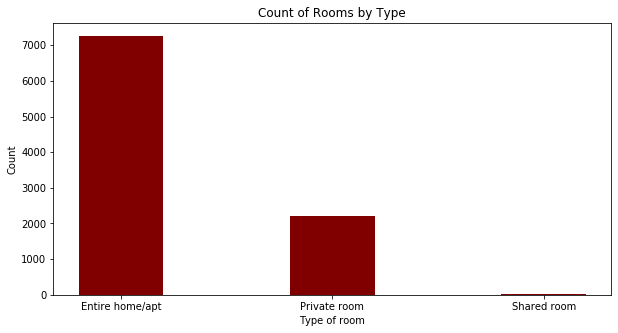

In [86]:
import numpy as np
import matplotlib.pyplot as plt 

fig = plt.figure(figsize = (10, 5))

# creating the bar plot
plt.bar(room_typ['index'], room_typ['room_type'], color ='maroon', 
        width = 0.4)

plt.xlabel("Type of room")
plt.ylabel("Count")
plt.title("Count of Rooms by Type")
plt.show()

In [116]:
m_2 = folium.Map(location=[52.37,4.89], tiles='cartodbpositron', zoom_start=11)

def color_producer(val):
    if val == 'Entire home/apt':
        return 'red'
        #return '#a6611a'
    elif val == 'Private room':
        return 'blue'
        #return '#018571'
    else:
        return 'gray'

for i in range(0,len(df)):
    folium.Circle(
        location=[df.iloc[i]['latitude'], df.iloc[i]['longitude']],
        radius=0.25,
        color=color_producer(df.iloc[i]['room_type'])).add_to(m_2)

m_2

we can see that there is no clear pattern of the distribution of apartments and private rooms in Central Amsterdam.

In [111]:
price = df.groupby('neighbourhood_cleansed').price.mean().reset_index()
price

,neighbourhood_cleansed,price
0,Bijlmer-Centrum,98.529412
1,Bijlmer-Oost,105.000000
2,Bos en Lommer,117.826248
3,Buitenveldert - Zuidas,147.790000
4,Centrum-Oost,184.083249
5,Centrum-West,194.347795
6,De Aker - Nieuw Sloten,125.000000
7,De Baarsjes - Oud-West,148.011858
8,De Pijp - Rivierenbuurt,156.277914
9,Gaasperdam - Driemond,105.421053


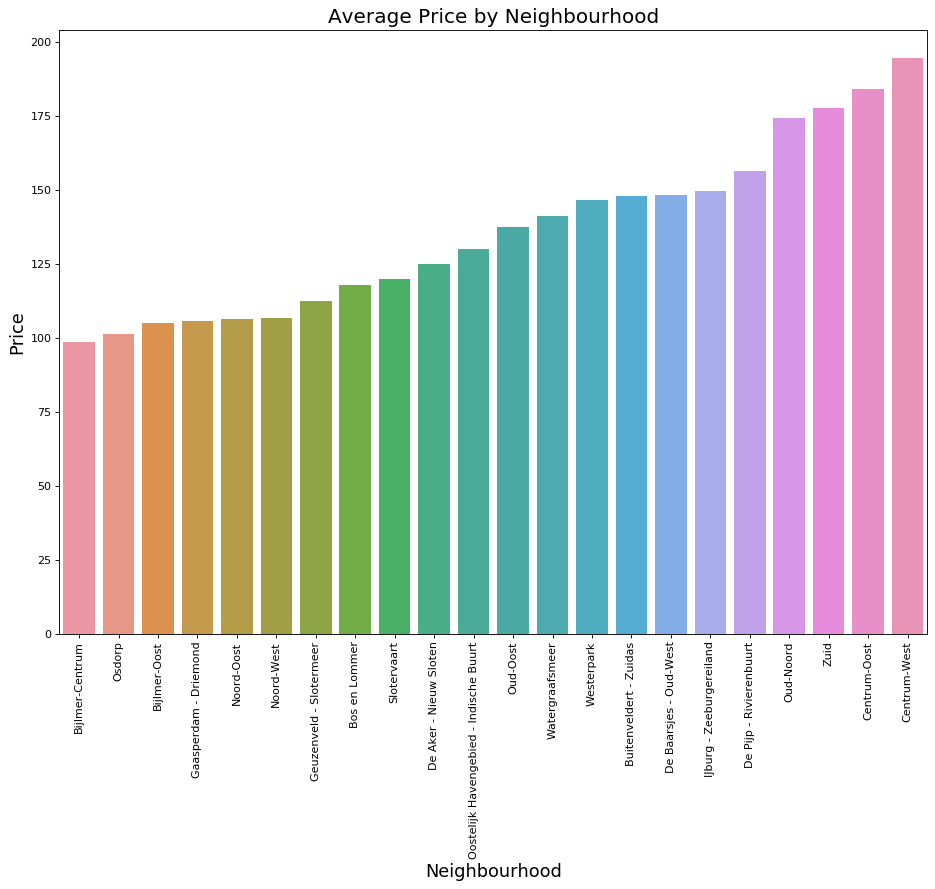

In [115]:
plt.figure(figsize=(14, 10), dpi=80)
sns.barplot(data = price.sort_values(by='price'), x = 'neighbourhood_cleansed', y='price')
plt.xticks(rotation = 90)
plt.xlabel('Neighbourhood', fontsize=16)
plt.ylabel('Price', fontsize=16)
plt.title('Average Price by Neighbourhood', fontsize=18)
plt.show()

In [101]:
geoj.set_index('neighbourhood', inplace=True)

m_5 = folium.Map(location=[52.37,4.89], tiles='cartodbpositron', zoom_start=11)

Choropleth(geo_data = geoj['geometry'].__geo_interface__, 
           data=price, 
           key_on="feature.id", 
           fill_color='BrBG', 
           legend_name='Average Price'
          ).add_to(m_5)
m_5

From the chloropeth, it can be observed that central Amsterdam is the most expensive while the outskirts of the city are more affordable.

OBSERVATIONS & FURTHER QUESTIONS THAT NEED INVESTIGATION

1. Which hosts have the most number of properties in the posh neighbourhoods of Amsterdam?
2. What factors among shared room types are similar to the ones in Central Amsterdam? If similar conditions are met, is there any possibility to increase the number of shared spaces? 
3. Why do some streets have more listings than others?